In [1]:
from skfda import FDataGrid
from skfda.datasets import make_gaussian_process
from skfda.exploratory.visualization import SurfaceBoxplot, Boxplot

import matplotlib.pyplot as plt
import numpy as np

In [2]:
# %%
# %%
import os
import sys
import numpy as np
# from torch.utils.data import TensorDataset, DataLoader

# DL-Kit
# sys.path.append('/Users/hgoldwyn/Research/projects/SR_CNN/dl-kit') #TODO adjust path
# sys.path.append('/projects/ecrpstats/dl-kit') #TODO adjust path
# from dlkit.log.log_util import (logging_set_up, logging_get_logger)
# # from dlkit.nets.mlp import MLPModel
# from dlkit.opt.train import train_epochs
# from dlkit.nets.conv2d import Conv2dUpscaleModelInterpolate

## Load model module
sys.path.append('/Users/hgoldwyn/Research/projects/SR_CNN/paper_repo/auxilary_modules') #TODO adjust path
sys.path.append('/projects/ecrpstats/distributional_SRCNN/auxilary_modules')
import data_loading

import matplotlib.pyplot as plt

import pandas as pd


train_or_load = 'load'
# %%
hr_data_size = 64
lr_data_size = 8
# %%
epochs = 300
batch_size = 32
##
num_sing_mode = 50
##
region = 0
subregion = 'all'

log_file_base_path = 'parCov_fitting'

save_path = f'{log_file_base_path}.pt'

## ~~~~~~~~~~~
## import data
xtrainHR, xtestHR, xtrainLR, xtestLR = data_loading.import_data(
    region,
    subregion,
    train_fraction=.75, 
    order='(subregion, time)'
    )

In [3]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [4]:
xtestHR[0].shape

(1, 64, 64)

Define basis functions

In [5]:
N = 64
def compl_dft_basis(x, y, k_x, k_y):
    return np.exp(1j * 2*np.pi * (k_x*x + k_y*y)/N)

In [6]:
x = np.arange(0, N)

xg = np.tile(x, N)            # generates x-coordinates for the entire grid N*K 
yg = np.repeat(x, N, axis=0)

mat_xg = xg.reshape((64, 64))
mat_yg = yg.reshape((64, 64))

In [7]:
## Create basis functions to max period
# max_T = 20
# min_k = int(N/max_T)
min_k = 0
print(f"min k : {min_k}")
# max_k = (N)//2
max_k = (N)//2 + 1
print(f"max k : {max_k}")

basis_function_k_idx = []
basis_functions = []
for _kx in range(min_k, max_k):
    for _ky in range(min_k, max_k):
        basis_functions.append(
            compl_dft_basis(
                mat_xg, 
                mat_yg, 
                _kx, 
                _ky
                )
            )
        basis_function_k_idx.append((_kx, _ky))
        
basis_functions = np.asarray(basis_functions).reshape((-1, 64**2)).T / N
basis_functions.shape

min k : 0
max k : 33


(4096, 1089)

In [8]:
## Generate complex tensor
# basis_functions_tensor = torch.tensor(basis_functions, dtype=torch.complex64).to(device)

Get standard MVN samples in basis space

In [9]:
# ## Define a sample generator
# def sample(x, cov, n_samples = test_set_size):
#     prng = np.random.RandomState(1234)
#     x_mean = np.zeros((len(x)**2))    # the mean is set to 0 here 
#     out = prng.multivariate_normal(x_mean, cov, n_samples)
#     return out
# ## Simulation of samples from a 2D-GP with zero mean and unit cov
# K = hr_data_size                        # number of points on each axis 
# x = np.linspace(0, 10, K)     # grid covers [0,10] * [0, 10] 
# ## Define unit covariance
# cov = np.eye(K**2)
# ## Get samples
# z = sample(x, cov)

Generate noise rescaling

In [10]:
def get_noise_from_cov_params(cov_params, n_samples=10):

    n_bf = basis_functions.T.shape[0]
    ## get samples from standard normal
    Z = np.random.randn(n_samples, n_bf)

    ## Rescale noise with data cov SVD
    R = np.matmul(basis_functions, np.diag(cov_params**0.5))
    ##              (n_pixels x n_bf)  x   (n_bf x n_bf)
    rescaled_noise = Z @ R.T
    return rescaled_noise

In [11]:
def get_noise_from_cov_params_wChol(cov_params, n_samples=10):

    Sigma = np.matmul(
        np.matmul(
            basis_functions, 
            np.diag(cov_params)
            ),
        np.conj(basis_functions.T)
        )
    
    L = np.linalg.cholesky(np.real(Sigma))

    Z = np.random.randn(n_samples, hr_data_size**2)
    rescaled_noise = Z @ L.T
    return rescaled_noise

(y - mu)^T phi diag(s) phi^dag (y - mu)
((y - mu)^T phi diag(s^0.5)) I ((y - mu)^T phi diag(s^0.5))^dag

Sigma = phi diag(s) phi^dag 
      = L^T L

Load covariance parameters

In [12]:
## analytic results with correct downscaling
global_cov_params = np.load("../stage_2/anal_sln_global_params.npy")

In [13]:
Sigma = np.matmul(
        np.matmul(
            basis_functions, 
            np.diag(global_cov_params)
            ),
        np.conj(basis_functions.T)
        )

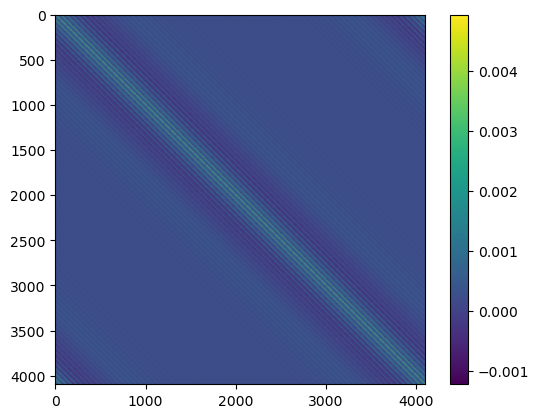

In [14]:
plt.imshow(np.real(Sigma))
plt.colorbar()

In [15]:
u, s, vh = np.linalg.svd(np.real(Sigma))

Z = np.random.randn(100, hr_data_size**2)
rescaled_noise = Z @ np.diag(s**0.5) @ u.T

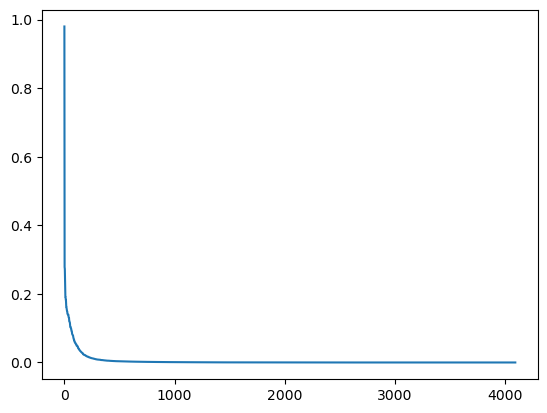

In [16]:
plt.plot(s)

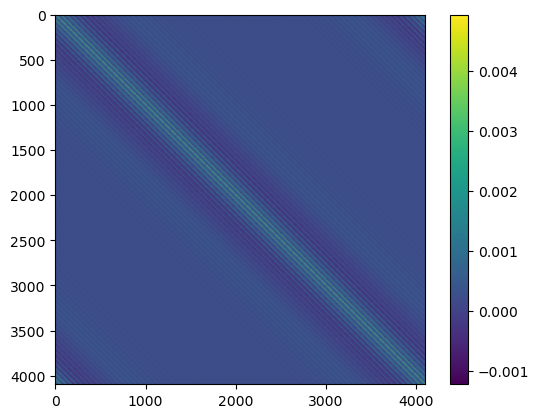

In [17]:
plt.imshow(u @ np.diag(s) @ u.T)
plt.colorbar()

In [18]:
Z = np.random.randn(1000, hr_data_size**2)
rescaled_noise = Z @ np.diag(s**0.5) @ u.T

In [19]:
rescaled_noise.shape

(1000, 4096)

In [20]:
np.save('mse_global_noise.npy', rescaled_noise)

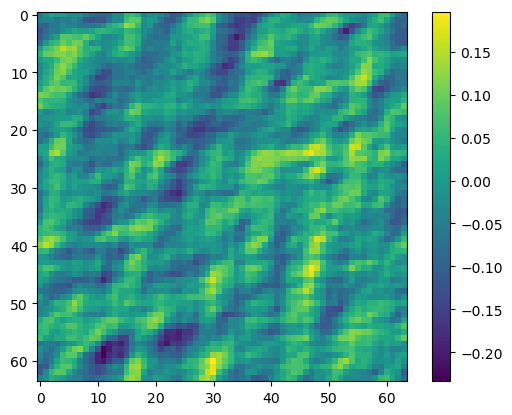

In [21]:
plt.imshow(rescaled_noise[0].reshape((64, 64)))
plt.colorbar()

In [22]:
global_cov_params.shape

(1089,)

Load global model 

In [23]:
path_to_global_err_fields = "../stage_3/output_data/fcov_GL_mseStart_global_errFields.npy"
global_err_fields = np.load(path_to_global_err_fields)
global_err_fields.shape

(214, 64, 64)

In [24]:
targets = xtestHR.squeeze()
targets.shape

(214, 64, 64)

In [25]:
global_pred = global_err_fields + targets

In [26]:
img_0_samples = rescaled_noise + global_pred[0].ravel()[None, :]
img_0_samples.shape

(1000, 4096)

In [27]:
raveled_targets = targets.reshape((targets.shape[0], 64**2))

In [28]:
# _for_plot = img_0_samples.reshape((-1, hr_data_size, hr_data_size))

In [29]:
def global_samples_for_plot(img_idx):
    _img_samples = rescaled_noise + global_pred[img_idx].ravel()[None, :]
    _out = _img_samples.reshape((-1, hr_data_size, hr_data_size))
    return _out


In [30]:
_for_plot = global_samples_for_plot(4)

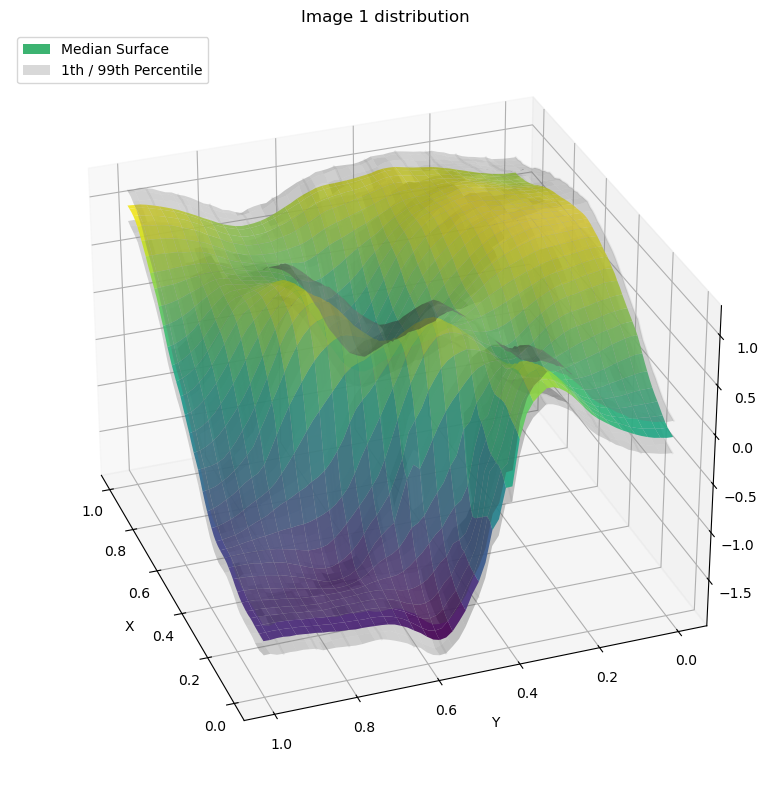

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated data: 100 surfaces over a 50x50 grid
n_samples = 100
nx, ny = 64, 64
surfaces = np.random.randn(n_samples, nx, ny)  # shape (n, nx, ny)

# X, Y grid
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

# Compute quantiles
median_surface = np.median(_for_plot, axis=0)
q99 = np.percentile(_for_plot, 99, axis=0)
q1 = np.percentile(_for_plot, 1, axis=0)

# Plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot median surface
ax.plot_surface(X, Y, median_surface, cmap='viridis', alpha=0.9, label='Median')

# Plot 25th percentile surface
ax.plot_surface(X, Y, q99, color='gray', alpha=0.3)

# Plot 75th percentile surface
ax.plot_surface(X, Y, q1, color='gray', alpha=0.3)

# Optional: fill between surfaces using lines
for i in range(0, nx, 5):  # less dense lines for clarity
    ax.plot(X[i], Y[i], q1[i], color='lightgray', alpha=0.4)
    ax.plot(X[i], Y[i], q99[i], color='lightgray', alpha=0.4)

ax.set_title("Image 1 distribution")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor='mediumseagreen', label='Median Surface'),
    Patch(facecolor='gray', alpha=0.3, label='1th / 99th Percentile')
]

ax.legend(handles=legend_elements, loc='upper left')

ax.view_init(azim=160)    # top-down


plt.tight_layout()
plt.show()


In [32]:
targets.shape

(214, 64, 64)

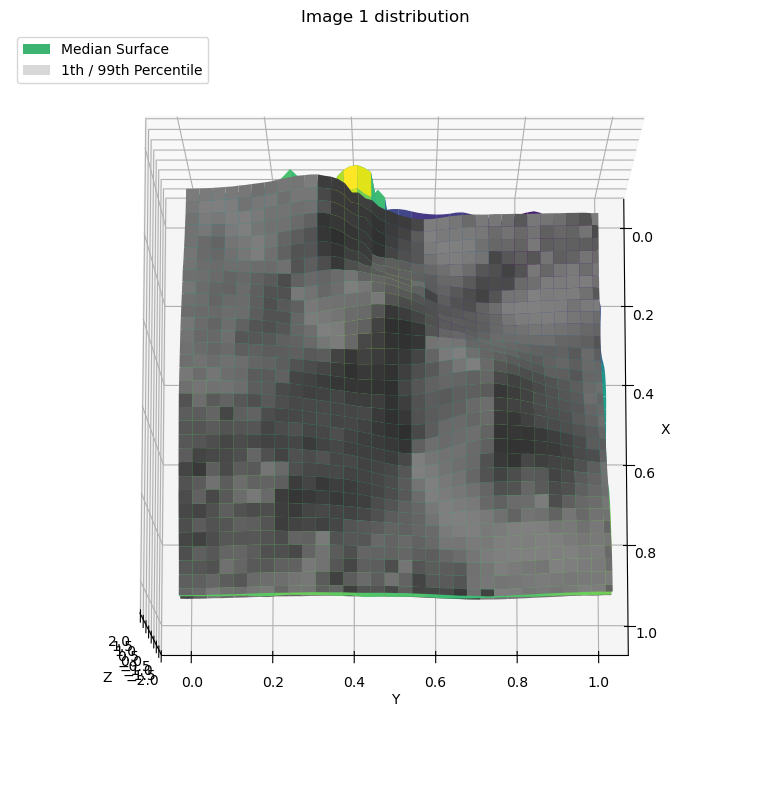

In [33]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated data: 100 surfaces over a 50x50 grid
n_samples = 100
nx, ny = 64, 64
surfaces = np.random.randn(n_samples, nx, ny)  # shape (n, nx, ny)

# X, Y grid
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

# Compute quantiles
# median_surface = np.median(_for_plot, axis=0)
target = targets[0]
q99 = np.percentile(_for_plot, 99, axis=0)
q1 = np.percentile(_for_plot, 1, axis=0)

# Plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot 75th percentile surface
ax.plot_surface(
    X, Y, q1, color='gray', 
    # alpha=1
    )

# Plot median surface
ax.plot_surface(X, Y, target, cmap='viridis', 
                # alpha=1, 
                label='Median')

# Plot 25th percentile surface
ax.plot_surface(X, Y, q99, color='gray', 
                # alpha=1
                )


# Optional: fill between surfaces using lines
# for i in range(0, nx, 5):  # less dense lines for clarity
#     ax.plot(X[i], Y[i], q1[i], color='lightgray', alpha=0.4)
#     ax.plot(X[i], Y[i], q99[i], color='lightgray', alpha=0.4)

ax.set_title("Image 1 distribution")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor='mediumseagreen', label='Median Surface'),
    Patch(facecolor='gray', alpha=0.3, label='1th / 99th Percentile')
]

ax.legend(handles=legend_elements, loc='upper left')

# ax.view_init(elev=20, azim=30)   # shallow angle, from front-left
ax.view_init(elev=80, azim=0)    # top-down
# ax.view_init(elev=10, azim=270)  # side view

plt.tight_layout()
plt.show()
# plt.legend()


This doesn't order surfaces correctly. I can try plotly, 

In [34]:
# import plotly.graph_objects as go

# fig = go.Figure()

# fig.add_surface(z=median_surface, x=X, y=Y, colorscale='Viridis', name='Median')
# fig.add_surface(z=q25, x=X, y=Y, opacity=0.3, showscale=False, name='25th %')
# fig.add_surface(z=q75, x=X, y=Y, opacity=0.3, showscale=False, name='75th %')

# fig.update_layout(title='3D Surface Box Plot', scene=dict(
#     xaxis_title='X', yaxis_title='Y', zaxis_title='Z'
# ))
# fig.show()

Need to build a new environment for that.

In the meantime, try a true functional boxplot

In [35]:

from skfda import FDataGrid


In [36]:
fd = FDataGrid(_for_plot)


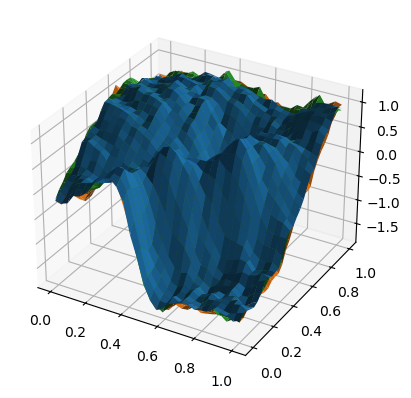

In [37]:
fd[:3].plot()
None


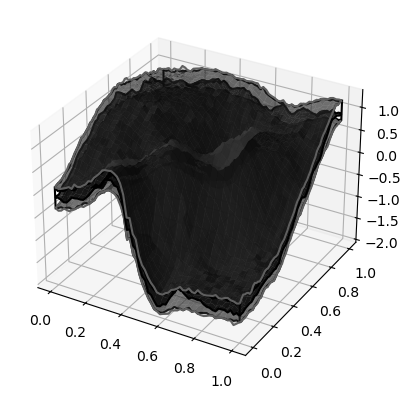

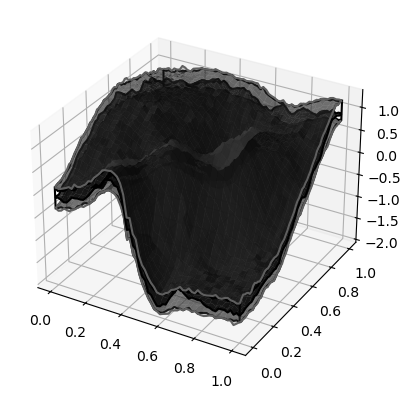

In [38]:
surfaceBoxplot = SurfaceBoxplot(fd)
surfaceBoxplot.plot()

In [39]:
fd.grid_points

(array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
        0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.14285714,
        0.15873016, 0.17460317, 0.19047619, 0.20634921, 0.22222222,
        0.23809524, 0.25396825, 0.26984127, 0.28571429, 0.3015873 ,
        0.31746032, 0.33333333, 0.34920635, 0.36507937, 0.38095238,
        0.3968254 , 0.41269841, 0.42857143, 0.44444444, 0.46031746,
        0.47619048, 0.49206349, 0.50793651, 0.52380952, 0.53968254,
        0.55555556, 0.57142857, 0.58730159, 0.6031746 , 0.61904762,
        0.63492063, 0.65079365, 0.66666667, 0.68253968, 0.6984127 ,
        0.71428571, 0.73015873, 0.74603175, 0.76190476, 0.77777778,
        0.79365079, 0.80952381, 0.82539683, 0.84126984, 0.85714286,
        0.87301587, 0.88888889, 0.9047619 , 0.92063492, 0.93650794,
        0.95238095, 0.96825397, 0.98412698, 1.        ]),
 array([0.        , 0.01587302, 0.03174603, 0.04761905, 0.06349206,
        0.07936508, 0.0952381 , 0.11111111, 0.12698413, 0.

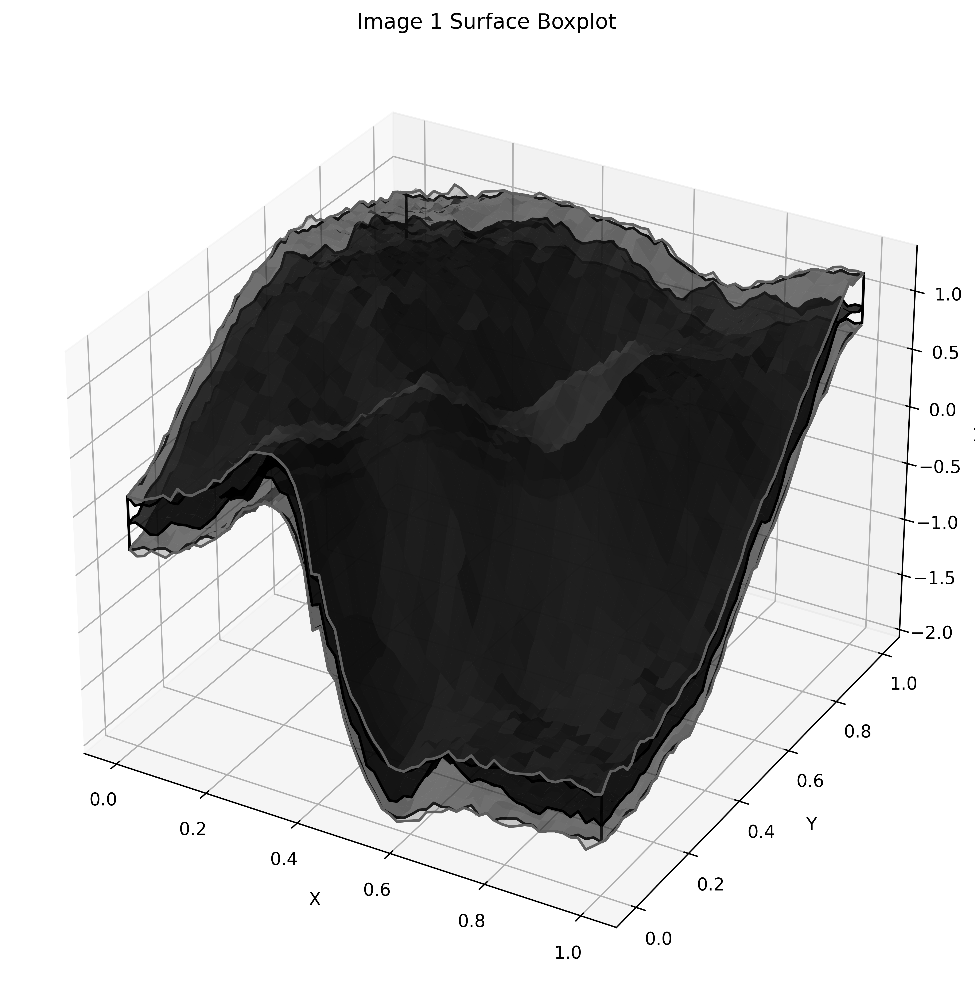

In [40]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Plot
fig = plt.figure(figsize=(8, 8), dpi=600)
ax = fig.add_subplot(111, projection='3d')

surfaceBoxplot = SurfaceBoxplot(
    fd, 
    axes=ax)
surfaceBoxplot.plot()

ax.set_title("Image 1 Surface Boxplot")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

# ax.plot(
#     np.ones(64)*.5, 
#     np.linspace(0, 1, 64), 
#     np.median(_for_plot, axis=0)[32, :]+1, 
#     label='3D line', color='red', linewidth=2)


# from matplotlib.patches import Patch
# legend_elements = [
#     Patch(facecolor='mediumseagreen', label='Median Surface'),
#     Patch(facecolor='gray', alpha=0.3, label='1th / 99th Percentile')
# ]
# ax.legend(handles=legend_elements, loc='upper left')

# ax.view_init(elev=20, azim=0)   # shallow angle, from front-left
# ax.view_init(elev=80, azim=0)    # top-down
# ax.view_init(elev=10, azim=270)  # side view

plt.tight_layout()
plt.show()
# plt.legend()


In [41]:
from skfda.exploratory.visualization import Boxplot


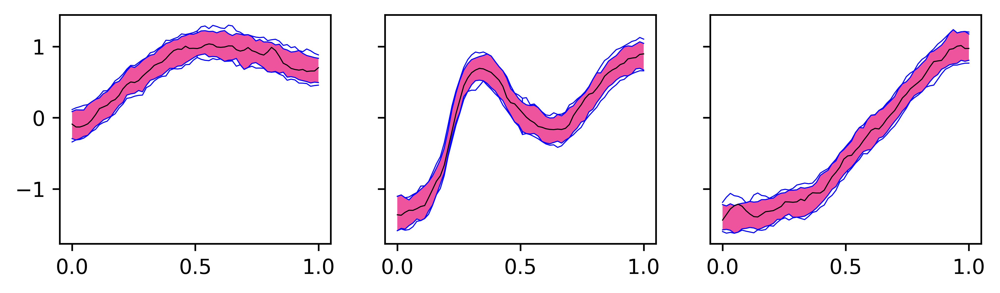

In [42]:
fig, axs = plt.subplots(1, 3, dpi=600, figsize=(8, 2), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)


sliced_fd_0 = FDataGrid(_for_plot[:, 0, :])
boxplot = Boxplot(sliced_fd_0, axes=axs[0])
boxplot.plot()

sliced_fd_1 = FDataGrid(_for_plot[:, 31, :])
boxplot = Boxplot(sliced_fd_1, axes=axs[1])
boxplot.plot()

sliced_fd_2 = FDataGrid(_for_plot[:, 63, :])
boxplot = Boxplot(sliced_fd_2, axes=axs[2])
boxplot.plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(.5)  # set your desired linewidth

fig.canvas.draw()  # update the figure if you're in an interactive session

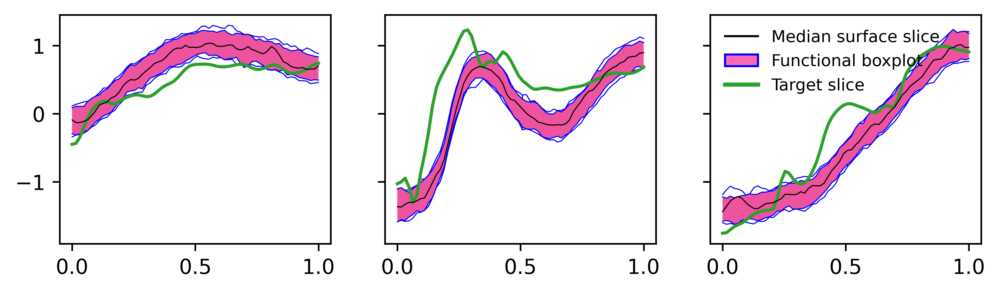

In [43]:
fig, axs = plt.subplots(1, 3, dpi=600, figsize=(8, 2), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)


sliced_fd_0 = FDataGrid(_for_plot[:, 0, :])
boxplot = Boxplot(sliced_fd_0, axes=axs[0])
boxplot.plot()

sliced_fd_1 = FDataGrid(_for_plot[:, 31, :])
boxplot = Boxplot(sliced_fd_1, axes=axs[1])
boxplot.plot()

sliced_fd_2 = FDataGrid(_for_plot[:, 63, :])
boxplot = Boxplot(sliced_fd_2, axes=axs[2])
boxplot.plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(.5)  # set your desired linewidth

fig.canvas.draw()  # update the figure if you're in an interactive session

axs[0].plot(np.linspace(0, 1, 64), targets[0, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[0, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[0, 63, :], color='C2', zorder=4, label='target')

## ~~~ Legend ~~~
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

line_legend = Line2D([0], [0], color='C2', linewidth=2, label='Target slice')

# Patch: pink fill, blue top & bottom borders (emulated via lines in legend)
# We combine a filled Patch with a dummy label and then stack two lines
pink_patch = Patch(facecolor='#ff69b4', edgecolor='blue', label='Functional boxplot')

# You can make a compound legend item using dummy lines:
# blue_top = Line2D([0], [0], color='blue', linewidth=2)
# blue_bottom = Line2D([0], [0], color='blue', linewidth=2)

# Then manually create a custom legend
custom_handles = [
    Line2D([], [], color='black', linewidth=1, label='Median surface slice'),
    pink_patch,
    line_legend,
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=8, frameon=False)


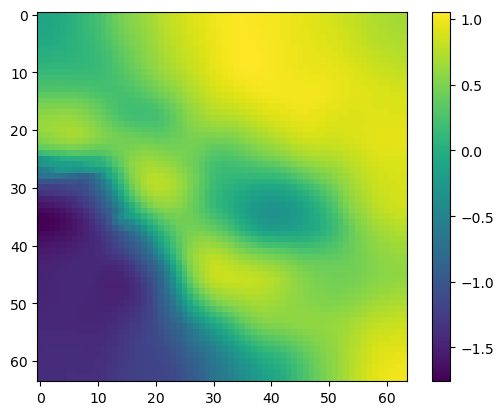

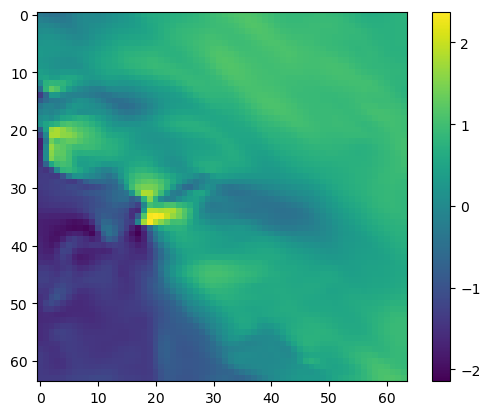

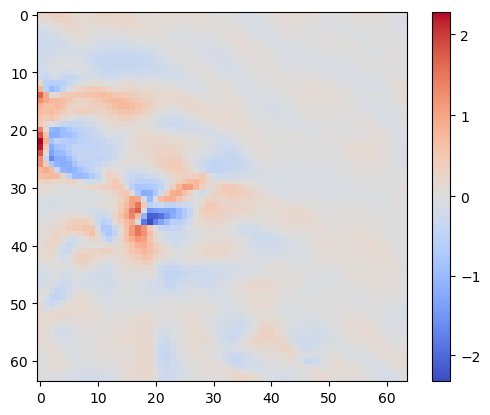

In [44]:
from matplotlib.colors import TwoSlopeNorm

plt.figure()
plt.imshow(global_pred[4])
plt.colorbar()

plt.figure()
plt.imshow(targets[4])
plt.colorbar()

plt.figure()
_err = global_err_fields[4]
norm = TwoSlopeNorm(vmin=_err.min(), vcenter=0, vmax=_err.max())
plt.imshow(_err, cmap='coolwarm', norm=norm)
plt.colorbar()

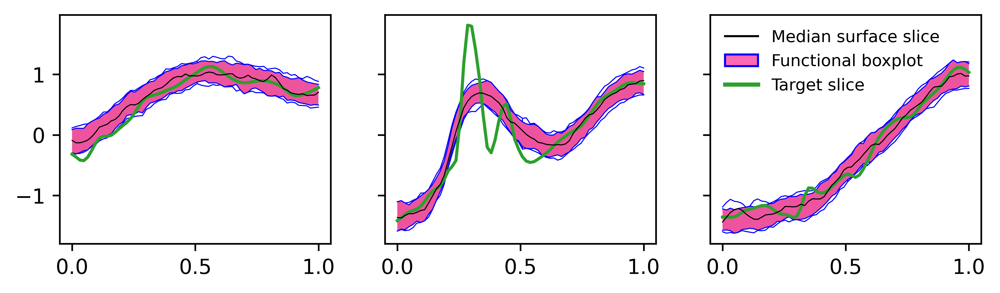

In [45]:
fig, axs = plt.subplots(1, 3, dpi=600, figsize=(8, 2), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)

_img_idx = 4
_img_samples = global_samples_for_plot(_img_idx)

sliced_fd_0 = FDataGrid(_img_samples[:, 0, :])
boxplot = Boxplot(sliced_fd_0, axes=axs[0])
boxplot.plot()

sliced_fd_1 = FDataGrid(_img_samples[:, 31, :])
boxplot = Boxplot(sliced_fd_1, axes=axs[1])
boxplot.plot()

sliced_fd_2 = FDataGrid(_img_samples[:, 63, :])
boxplot = Boxplot(sliced_fd_2, axes=axs[2])
boxplot.plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(.5)  # set your desired linewidth

fig.canvas.draw()  # update the figure if you're in an interactive session

axs[0].plot(np.linspace(0, 1, 64), targets[_img_idx, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[_img_idx, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[_img_idx, 63, :], color='C2', zorder=4, label='target')

## ~~~ Legend ~~~
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

line_legend = Line2D([0], [0], color='C2', linewidth=2, label='Target slice')

# Patch: pink fill, blue top & bottom borders (emulated via lines in legend)
# We combine a filled Patch with a dummy label and then stack two lines
pink_patch = Patch(facecolor='#ff69b4', edgecolor='blue', label='Functional boxplot')

# You can make a compound legend item using dummy lines:
# blue_top = Line2D([0], [0], color='blue', linewidth=2)
# blue_bottom = Line2D([0], [0], color='blue', linewidth=2)

# Then manually create a custom legend
custom_handles = [
    Line2D([], [], color='black', linewidth=1, label='Median surface slice'),
    pink_patch,
    line_legend,
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=8, frameon=False)


# img-specific model

In [119]:
def get_noise_from_cov_params_wSVD(cov_params, n_samples=10):

    Sigma = np.matmul(
        np.matmul(
            basis_functions, 
            np.diag(cov_params)
            ),
        np.conj(basis_functions.T)
        )
    
    u, s, vh = np.linalg.svd(np.real(Sigma))
    
    Z = np.random.randn(n_samples, hr_data_size**2)
    
    rescaled_noise = Z @ np.diag(s**0.5) @ u.T
    
    return rescaled_noise

In [122]:
## analytic results with correct downscaling
p5p5_cov_params = np.load(
    "../stage_2/output/parCov_fitting_fourier_allImages_mseStart_globalPrior_anal_empPriorStdOn5p5_param_fits.npy"
    )

p5p5_err = np.load(
    "../stage_3/output_data/fcov_GL_mseStart_gPAStdOn5p5_errFields.npy")

In [123]:
p5p5_pred = p5p5_err + targets

In [124]:
p5p5_pred.shape

(214, 64, 64)

In [125]:
p5p5_cov_params.shape

(856, 1089)

In [126]:
test_p5p5_cov_params = p5p5_cov_params[-214:]
test_p5p5_cov_params.shape

(214, 1089)

In [128]:
p5p5_img_4_noise = get_noise_from_cov_params_wSVD(test_p5p5_cov_params[4], n_samples=100)
# p5p5_img_100_noise = get_noise_from_cov_params_wSVD(test_p5p5_cov_params[100], n_samples=100)
# p5p5_img_200_noise = get_noise_from_cov_params_wSVD(test_p5p5_cov_params[200], n_samples=100)


In [130]:
p5p5_img_4_noise.shape

(100, 4096)

In [133]:
np.save('p5p5_img_4_noise.npy', p5p5_img_4_noise)
# np.save('sample_data/p2p5_img_100_noise.npy', p2p5_img_100_noise)
# np.save('sample_data/p2p5_img_200_noise.npy', p2p5_img_200_noise)

In [ ]:
def p5p5_samples_for_plot(img, noise):
    _img_samples = noise + img.ravel()[None, :]
    _out = _img_samples.reshape((-1, hr_data_size, hr_data_size))
    return _out

In [ ]:
p5p5_img4_samples = p5p5_samples_for_plot(p5p5_pred[4], p5p5_img_4_noise)

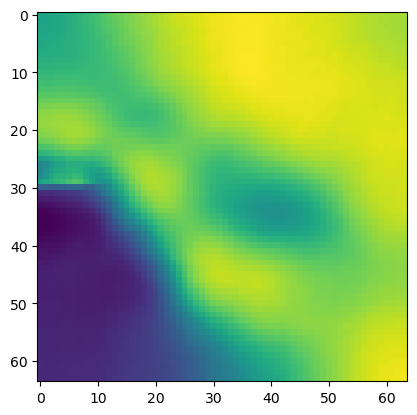

In [136]:
plt.imshow(np.median(p5p5_img4_samples, axis=0))

In [157]:

# plt.figure(figsize=(2, 2), dpi=600)
# im = plt.imshow(xtestLR[0,0])
# ax = plt.gca()
# ax.set_axis_off()
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)  # Size is width, pad is spacing
# fig.colorbar(im, cax=cax)

In [158]:
# # xtestHR[0].shape
# plt.figure(figsize=(2, 2), dpi=600)
# im = plt.imshow(p2p5_pred[0])
# ax = plt.gca()
# ax.set_axis_off()
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)  # Size is width, pad is spacing
# fig.colorbar(im, cax=cax)

In [159]:
# plt.figure(figsize=(2, 2), dpi=600)
# im = plt.imshow(targets[0])
# ax = plt.gca()
# ax.set_axis_off()
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)  # Size is width, pad is spacing
# fig.colorbar(im, cax=cax)

In [160]:
# ## PLot hr target
# plt.figure(figsize=(2, 2), dpi=600)
# im = plt.imshow(targets[0])
# ax = plt.gca()
# ax.set_axis_off()
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)  # Size is width, pad is spacing
# fig.colorbar(im, cax=cax)

In [161]:
## plot samples
# for i in range(10):
#     plt.figure(figsize=(2, 2), dpi=600)
#     im = plt.imshow(p2p5_img0_samples[i])
#     ax = plt.gca()
#     ax.set_axis_off()
#     divider = make_axes_locatable(ax)
#     cax = divider.append_axes("right", size="5%", pad=0.05)  # Size is width, pad is spacing
#     fig.colorbar(im, cax=cax)

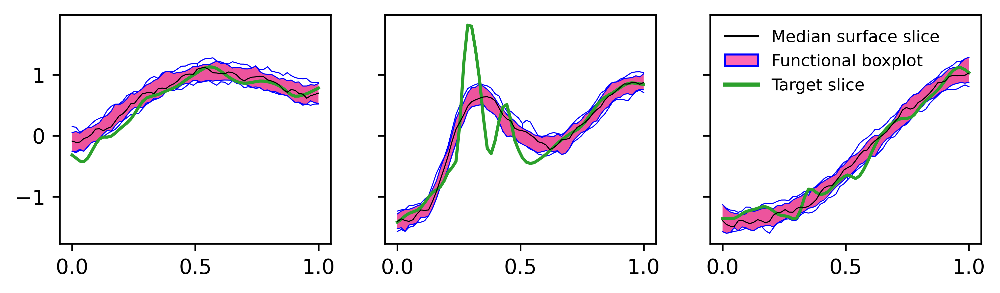

In [162]:

fig, axs = plt.subplots(1, 3, dpi=600, figsize=(8, 2), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)

_img_idx = 4
_img_samples = p5p5_img4_samples

sliced_fd_0 = FDataGrid(_img_samples[:, 0, :])
boxplot = Boxplot(sliced_fd_0, axes=axs[0])
boxplot.plot()

sliced_fd_1 = FDataGrid(_img_samples[:, 31, :])
boxplot = Boxplot(sliced_fd_1, axes=axs[1])
boxplot.plot()

sliced_fd_2 = FDataGrid(_img_samples[:, 63, :])
boxplot = Boxplot(sliced_fd_2, axes=axs[2])
boxplot.plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(.5)  # set your desired linewidth

fig.canvas.draw()  # update the figure if you're in an interactive session

axs[0].plot(np.linspace(0, 1, 64), targets[_img_idx, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[_img_idx, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[_img_idx, 63, :], color='C2', zorder=4, label='target')

## ~~~ Legend ~~~
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

line_legend = Line2D([0], [0], color='C2', linewidth=2, label='Target slice')

# Patch: pink fill, blue top & bottom borders (emulated via lines in legend)
# We combine a filled Patch with a dummy label and then stack two lines
pink_patch = Patch(facecolor='#ff69b4', edgecolor='blue', label='Functional boxplot')

# You can make a compound legend item using dummy lines:
# blue_top = Line2D([0], [0], color='blue', linewidth=2)
# blue_bottom = Line2D([0], [0], color='blue', linewidth=2)

# Then manually create a custom legend
custom_handles = [
    Line2D([], [], color='black', linewidth=1, label='Median surface slice'),
    pink_patch,
    line_legend,
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=8, frameon=False)


Quantify containment within surface boxplot

In [142]:
fd = FDataGrid(p5p5_img4_samples)

surfaceBoxplot = SurfaceBoxplot(fd)
# envelope = surfaceBoxplot.central_envelope_

In [143]:
from skfda.exploratory.depth import ModifiedBandDepth

# Create the depth object
depth = ModifiedBandDepth()

# Evaluate depths on the dataset
depths = depth(fd)

In [144]:
# Get index of the deepest (median) surface
median_idx = np.argmax(depths)
median_surface = fd[median_idx].data_matrix.squeeze()

# Get central region (e.g., 50% deepest)
n = len(fd)
central_region_indices = np.argsort(-depths)[:n // 2]
central_region = fd[central_region_indices]

In [145]:
surfaces = central_region.data_matrix
lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
upper_surface = np.max(surfaces, axis=0)


In [146]:
lower_surface.shape

(64, 64, 1)

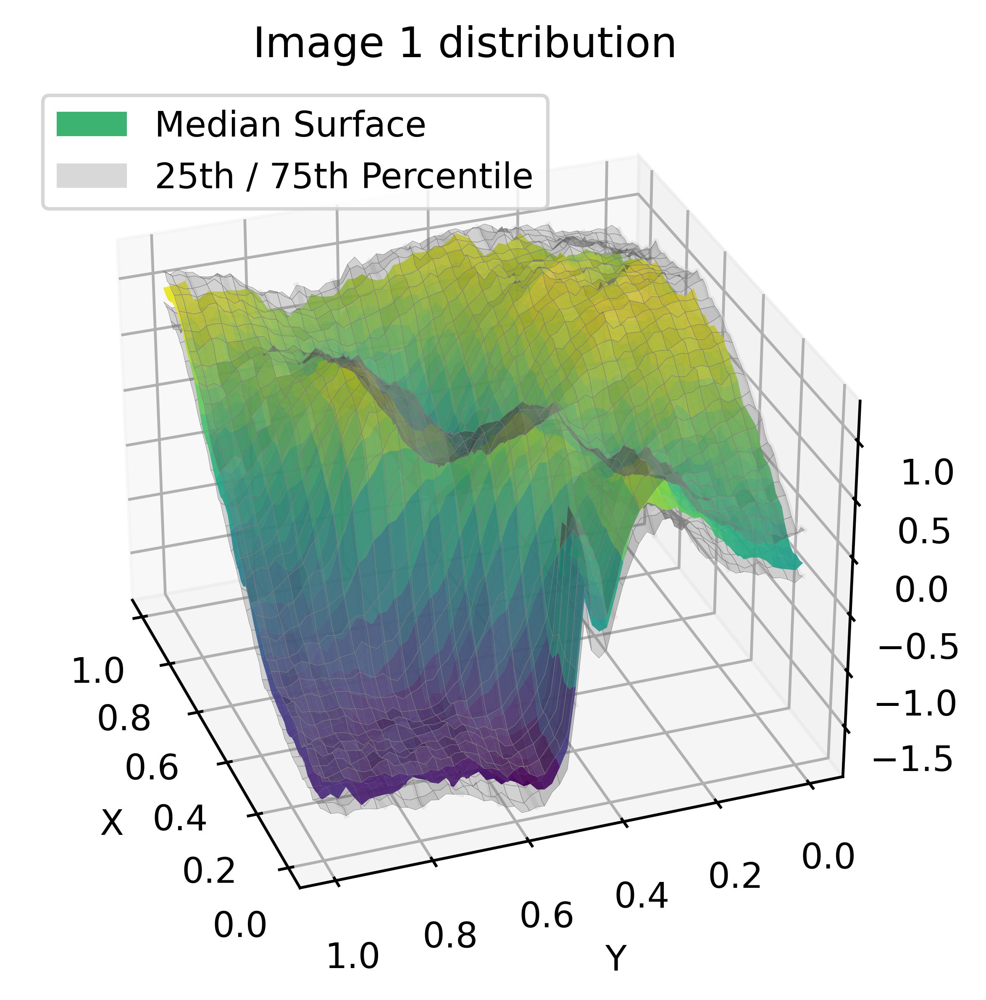

In [148]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated data: 100 surfaces over a 50x50 grid
n_samples = 100
nx, ny = 64, 64
surfaces = np.random.randn(n_samples, nx, ny)  # shape (n, nx, ny)

# X, Y grid
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

# Compute quantiles
# median_surface = median_surface.data_matrix.squeeze()
q75 = upper_surface.squeeze()
q25 = lower_surface.squeeze()

# Plot
fig = plt.figure(figsize=(6, 4), dpi=600)
ax = fig.add_subplot(111, projection='3d')

# Plot median surface
ax.plot_surface(X, Y, median_surface, cmap='viridis', alpha=0.9, label='Median')

# Plot 25th percentile surface
ax.plot_surface(
    X, Y, q75, color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    # edgealpha=.3,
    alpha=0.3
    )

# Plot 75th percentile surface
ax.plot_surface(
    X, 
    Y, 
    q25, 
    color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    alpha=0.3)

# Optional: fill between surfaces using lines
for i in range(0, nx, 5):  # less dense lines for clarity
    ax.plot(X[i], Y[i], q25[i], color='lightgray', alpha=0.4)
    ax.plot(X[i], Y[i], q75[i], color='lightgray', alpha=0.4)

ax.set_title("Image 1 distribution")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor='mediumseagreen', label='Median Surface'),
    Patch(facecolor='gray', alpha=0.3, label='25th / 75th Percentile')
]

ax.legend(handles=legend_elements, loc='upper left')

# ax.view_init(elev=15, azim=-100)   # shallow angle, from front-left
ax.view_init(azim=160)    # top-down



plt.tight_layout()
plt.show()


Global

In [177]:
# fd_g = FDataGrid(img_0_samples.reshape((-1, hr_data_size, hr_data_size)))
fd_g = FDataGrid(global_samples_for_plot(4))


In [178]:
# Evaluate depths on the dataset
depths = depth(fd_g)

In [179]:
# Get index of the deepest (median) surface
median_idx = np.argmax(depths)
median_surface = fd_g[median_idx].data_matrix.squeeze()

# Get central region (e.g., 50% deepest)
n = len(fd_g)
central_region_indices = np.argsort(-depths)[:n // 2]
central_region = fd_g[central_region_indices]

In [180]:
surfaces = central_region.data_matrix
lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
upper_surface = np.max(surfaces, axis=0)


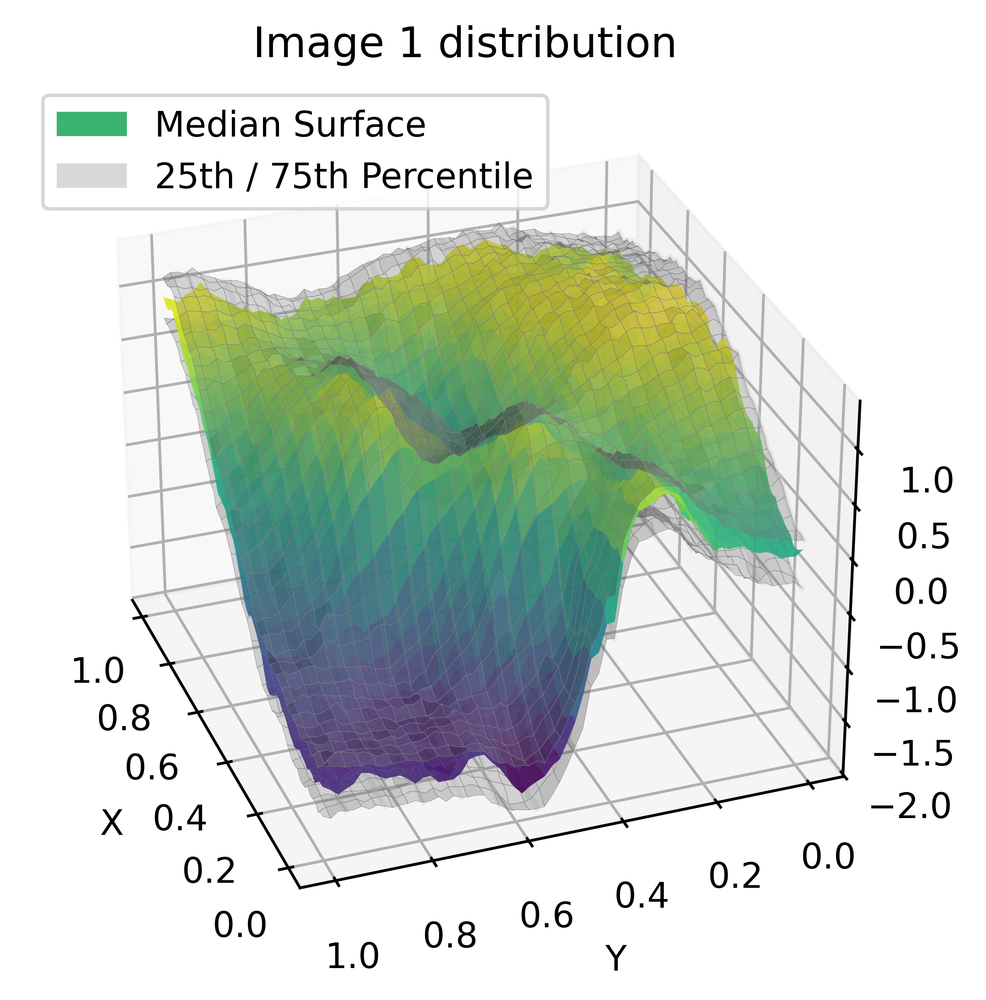

In [182]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Simulated data: 100 surfaces over a 50x50 grid
n_samples = 100
nx, ny = 64, 64
surfaces = np.random.randn(n_samples, nx, ny)  # shape (n, nx, ny)

# X, Y grid
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
X, Y = np.meshgrid(x, y)

# Compute quantiles
# median_surface = median_surface.data_matrix.squeeze()
q75 = upper_surface.squeeze()
q25 = lower_surface.squeeze()

# Plot
fig = plt.figure(figsize=(6, 4), dpi=600)
ax = fig.add_subplot(111, projection='3d')

# Plot median surface
ax.plot_surface(X, Y, median_surface, cmap='viridis', alpha=0.9, label='Median')

# Plot 25th percentile surface
ax.plot_surface(
    X, Y, q75, color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    # edgealpha=.3,
    alpha=0.3
    )

# Plot 75th percentile surface
ax.plot_surface(
    X, 
    Y, 
    q25, 
    color='gray', 
    edgecolor='grey', 
    linewidth=.1,
    alpha=0.3)

# Optional: fill between surfaces using lines
for i in range(0, nx, 5):  # less dense lines for clarity
    ax.plot(X[i], Y[i], q25[i], color='lightgray', alpha=0.4)
    ax.plot(X[i], Y[i], q75[i], color='lightgray', alpha=0.4)

ax.set_title("Image 1 distribution")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor='mediumseagreen', label='Median Surface'),
    Patch(facecolor='gray', alpha=0.3, label='25th / 75th Percentile')
]

ax.legend(handles=legend_elements, loc='upper left')

# ax.view_init(elev=15, azim=-100)   # shallow angle, from front-left
ax.view_init(azim=160)    # top-down



plt.tight_layout()
plt.show()


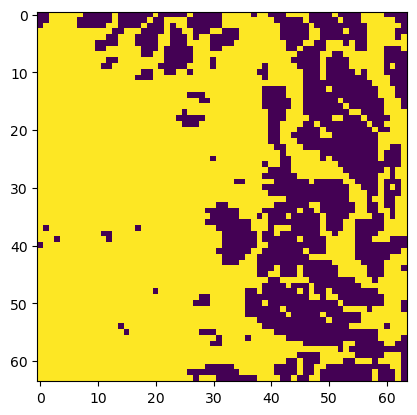

In [102]:
plt.imshow(np.logical_and(
    lower_surface.squeeze() < targets[0],
    upper_surface.squeeze() > targets[0])
)

In [103]:
np.logical_and(
    lower_surface.squeeze() < targets[0],
    upper_surface.squeeze() > targets[0]).sum() / hr_data_size**2

np.float64(0.6923828125)

Loop through each image and get target coverage

In [ ]:
global_noise = get_noise_from_cov_params_wSVD(global_cov_params, n_samples=100)

In [ ]:
global_coverage = []
imgspe_coverage = []

path_to_img_spec_noise = "/Users/hgoldwyn/Research/projects/SR_CNN/sr_cnn/real_data/torch/notebooks/covariance_subroutine/sample_data/from_kestrel/"

for i in range(targets.shape[0]):
    print(i)

    ## Get GLOBAL result
    g_samples = rescaled_noise + global_pred[i].ravel()[None, :]
    fd = FDataGrid(img_0_samples.reshape((-1, hr_data_size, hr_data_size)))

    # Evaluate depths on the dataset
    depths = depth(fd)
    # Get index of the deepest (median) surface
    median_idx = np.argmax(depths)
    median_surface = fd[median_idx].data_matrix.squeeze()

    # Get central region (e.g., 50% deepest)
    n = len(fd)
    central_region_indices = np.argsort(-depths)[:n // 2]
    central_region = fd_g[central_region_indices]
    surfaces = central_region.data_matrix
    lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
    upper_surface = np.max(surfaces, axis=0)

    global_coverage.append(np.logical_and(
        lower_surface.squeeze() < targets[0],
        upper_surface.squeeze() > targets[0]).sum() / hr_data_size**2
        )
    
    ## Get IMG-SPE result
    imgspe_samples = np.load(path_to_img_spec_noise + f"p2p5_img_{i}_noise_samples.npy") 
    
    fd = FDataGrid(imgspe_samples.reshape((-1, hr_data_size, hr_data_size)))

    # Evaluate depths on the dataset
    depths = depth(fd)
    # Get index of the deepest (median) surface
    median_idx = np.argmax(depths)
    median_surface = fd[median_idx].data_matrix.squeeze()

    # Get central region (e.g., 50% deepest)
    n = len(fd)
    central_region_indices = np.argsort(-depths)[:n // 2]
    central_region = fd[central_region_indices]
    surfaces = central_region.data_matrix
    lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
    upper_surface = np.max(surfaces, axis=0)

    imgspe_coverage.append(np.logical_and(
        lower_surface.squeeze() < targets[0],
        upper_surface.squeeze() > targets[0]).sum() / hr_data_size**2
        )


0
1
2
3
4
5


FileNotFoundError: [Errno 2] No such file or directory: '/Users/hgoldwyn/Research/projects/SR_CNN/sr_cnn/real_data/torch/notebooks/covariance_subroutine/sample_data/from_kestrel/p2p5_img_5_noise_samples.npy'

In [190]:
global_coverage

[np.float64(0.6923828125),
 np.float64(0.6923828125),
 np.float64(0.6923828125),
 np.float64(0.6923828125),
 np.float64(0.6923828125),
 np.float64(0.6923828125)]

# More samples

In [ ]:
def samples_for_plot(img, noise):
    _img_samples = noise + img.ravel()[None, :]
    _out = _img_samples.reshape((-1, hr_data_size, hr_data_size))
    return _out

In [41]:
global_cov_params.shape

(1089,)

In [42]:
global_img_0_noise_500 = get_noise_from_cov_params_wSVD(global_cov_params, n_samples=500)


In [46]:
global_img0_samples_500 = samples_for_plot(global_pred[0], global_img_0_noise_500)

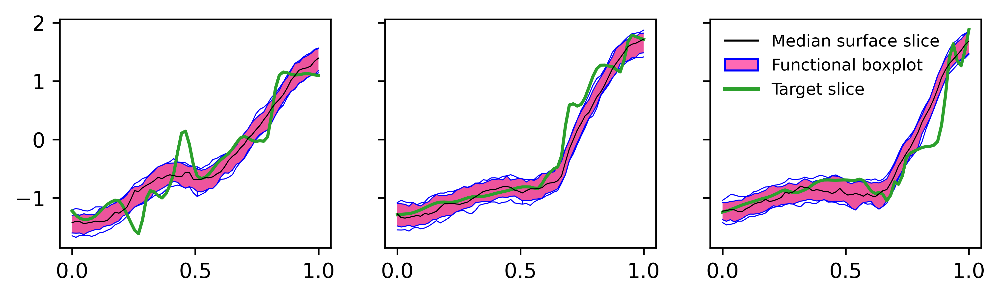

In [47]:

fig, axs = plt.subplots(1, 3, dpi=600, figsize=(8, 2), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)

_img_idx = 0
_img_samples = global_img0_samples_500

sliced_fd_0 = FDataGrid(_img_samples[:, 0, :])
boxplot = Boxplot(sliced_fd_0, axes=axs[0])
boxplot.plot()

sliced_fd_1 = FDataGrid(_img_samples[:, 31, :])
boxplot = Boxplot(sliced_fd_1, axes=axs[1])
boxplot.plot()

sliced_fd_2 = FDataGrid(_img_samples[:, 63, :])
boxplot = Boxplot(sliced_fd_2, axes=axs[2])
boxplot.plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(.5)  # set your desired linewidth

fig.canvas.draw()  # update the figure if you're in an interactive session

axs[0].plot(np.linspace(0, 1, 64), targets[_img_idx, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[_img_idx, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[_img_idx, 63, :], color='C2', zorder=4, label='target')

## ~~~ Legend ~~~
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

line_legend = Line2D([0], [0], color='C2', linewidth=2, label='Target slice')

# Patch: pink fill, blue top & bottom borders (emulated via lines in legend)
# We combine a filled Patch with a dummy label and then stack two lines
pink_patch = Patch(facecolor='#ff69b4', edgecolor='blue', label='Functional boxplot')

# You can make a compound legend item using dummy lines:
# blue_top = Line2D([0], [0], color='blue', linewidth=2)
# blue_bottom = Line2D([0], [0], color='blue', linewidth=2)

# Then manually create a custom legend
custom_handles = [
    Line2D([], [], color='black', linewidth=1, label='Median surface slice'),
    pink_patch,
    line_legend,
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=8, frameon=False)


In [30]:
test_p2p5_cov_params.shape

(257, 1089)

In [31]:
p2p5_img_0_noise_500 = get_noise_from_cov_params_wSVD(test_p2p5_cov_params[0], n_samples=500)


In [32]:
def samples_for_plot(img, noise):
    _img_samples = noise + img.ravel()[None, :]
    _out = _img_samples.reshape((-1, hr_data_size, hr_data_size))
    return _out

In [33]:
p2p5_pred.shape

(257, 64, 64)

In [34]:
p2p5_img0_samples_500 = samples_for_plot(p2p5_pred[0], p2p5_img_0_noise_500)

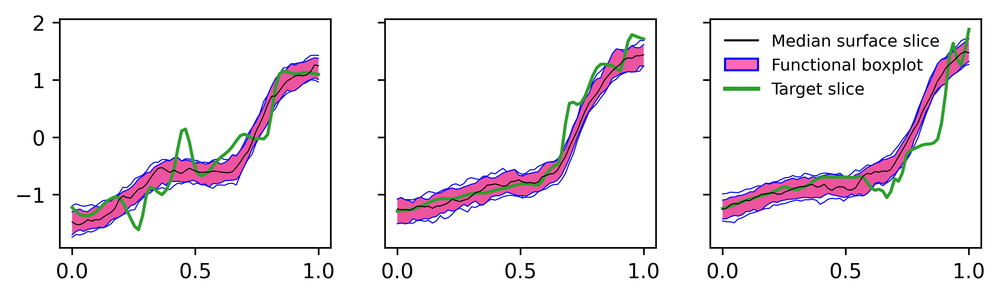

In [40]:

fig, axs = plt.subplots(1, 3, dpi=600, figsize=(8, 2), sharey=True)
# fig, axs = plt.subplots(3, 1, dpi=600, figsize=(4, 8), sharey=True, sharex=True)

_img_idx = 0
_img_samples = p2p5_img0_samples_500

sliced_fd_0 = FDataGrid(_img_samples[:, 0, :])
boxplot = Boxplot(sliced_fd_0, axes=axs[0])
boxplot.plot()

sliced_fd_1 = FDataGrid(_img_samples[:, 31, :])
boxplot = Boxplot(sliced_fd_1, axes=axs[1])
boxplot.plot()

sliced_fd_2 = FDataGrid(_img_samples[:, 63, :])
boxplot = Boxplot(sliced_fd_2, axes=axs[2])
boxplot.plot()

for ax in axs:
    for line in ax.get_lines():
        line.set_linewidth(.5)  # set your desired linewidth

fig.canvas.draw()  # update the figure if you're in an interactive session

axs[0].plot(np.linspace(0, 1, 64), targets[_img_idx, 0, :], color='C2', zorder=4)
axs[1].plot(np.linspace(0, 1, 64), targets[_img_idx, 31, :], color='C2', zorder=4)
axs[2].plot(np.linspace(0, 1, 64), targets[_img_idx, 63, :], color='C2', zorder=4, label='target')

## ~~~ Legend ~~~
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

line_legend = Line2D([0], [0], color='C2', linewidth=2, label='Target slice')

# Patch: pink fill, blue top & bottom borders (emulated via lines in legend)
# We combine a filled Patch with a dummy label and then stack two lines
pink_patch = Patch(facecolor='#ff69b4', edgecolor='blue', label='Functional boxplot')

# You can make a compound legend item using dummy lines:
# blue_top = Line2D([0], [0], color='blue', linewidth=2)
# blue_bottom = Line2D([0], [0], color='blue', linewidth=2)

# Then manually create a custom legend
custom_handles = [
    Line2D([], [], color='black', linewidth=1, label='Median surface slice'),
    pink_patch,
    line_legend,
]

axs[2].legend(handles=custom_handles, loc='upper left', fontsize=8, frameon=False)


In [48]:
from skfda.exploratory.depth import ModifiedBandDepth

# Create the depth object
depth = ModifiedBandDepth()

In [49]:
global_50_coverage = []
p2p5_50_coverage = []

path_to_img_spec_noise = "/Users/hgoldwyn/Research/projects/SR_CNN/sr_cnn/real_data/torch/notebooks/covariance_subroutine/sample_data/from_kestrel/"

for i in range(targets.shape[0]):
    print(i)

    #### Get GLOBAL result
    ## resample noise
    # g_noise = get_noise_from_cov_params_wSVD(global_u, global_s, n_samples=100)
    
    # g_samples = g_noise + global_pred[i].ravel()[None, :]
    g_samples = global_img0_samples_500
    
    ## Compute surfaces
    fd = FDataGrid(g_samples.reshape((-1, hr_data_size, hr_data_size)))
    # Evaluate depths on the dataset
    depths = depth(fd)
    # Get index of the deepest (median) surface
    median_idx = np.argmax(depths)
    median_surface = fd[median_idx].data_matrix.squeeze()

    # Get central region (e.g., 50% deepest)
    n = len(fd)
    central_region_indices = np.argsort(-depths)[:n // 2]
    central_region = fd[central_region_indices]
    surfaces = central_region.data_matrix
    lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
    upper_surface = np.max(surfaces, axis=0)

    global_50_coverage.append(np.logical_and(
        lower_surface.squeeze() < targets[i],
        upper_surface.squeeze() > targets[i]).sum() / hr_data_size**2
        )
    
    ## Get IMG-SPE result
    # is_noise = np.load(path_to_img_spec_noise + f"p2p5_img_{599+i}_noise_samples.npy") 
    # is_samples = p2p5_pred[i].ravel()[None, :] + is_noise
    is_samples = p2p5_img0_samples_500
    
    fd = FDataGrid(is_samples.reshape((-1, hr_data_size, hr_data_size)))

    # Evaluate depths on the dataset
    depths = depth(fd)
    # Get index of the deepest (median) surface
    median_idx = np.argmax(depths)
    median_surface = fd[median_idx].data_matrix.squeeze()

    # Get central region (e.g., 50% deepest)
    n = len(fd)
    central_region_indices = np.argsort(-depths)[:n // 2]
    central_region = fd[central_region_indices]
    surfaces = central_region.data_matrix
    lower_surface = np.min(surfaces, axis=0)  # shape: (nx, ny)
    upper_surface = np.max(surfaces, axis=0)

    p2p5_50_coverage.append(np.logical_and(
        lower_surface.squeeze() < targets[i],
        upper_surface.squeeze() > targets[i]).sum() / hr_data_size**2
        )
    
    if i == 10:
        break


0
1
2
3
4
5


KeyboardInterrupt: 

In [50]:
global_50_coverage

[np.float64(0.767822265625),
 np.float64(0.57421875),
 np.float64(0.32373046875),
 np.float64(0.20947265625),
 np.float64(0.238037109375)]

In [51]:
p2p5_50_coverage

[np.float64(0.7509765625),
 np.float64(0.62109375),
 np.float64(0.3818359375),
 np.float64(0.209716796875),
 np.float64(0.263671875)]